In [1]:
########################################################################### START ###########################################################################
# Access to Drive
# Modules
# Data import
# DataFrames

## 1 - Gives access to the Drive
from google.colab import drive
drive.mount('/content/drive')

## 2 - Modules import
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2

import sys, os
from pathlib import Path
import shutil
import glob
import itertools

import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam

from tensorflow.keras.applications import EfficientNetB0

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, TerminateOnNaN, EarlyStopping

from tensorflow.keras.utils import Sequence
from collections import Counter
from sklearn.utils.class_weight import compute_class_weight

from keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix

sys.path.append('/content/drive/MyDrive/Leukopy')
import leukopy_lib as leuko
from importlib import reload

reload(leuko)

## GPU status verification
tf.test.gpu_device_name()

## GPU type verification
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Mounted at /content/drive
Fri Oct  1 10:59:12 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.63.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   38C    P0    34W / 250W |    345MiB / 16280MiB |      1%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                              

In [2]:
########################################################################### DATAFRAME ###########################################################################

## Need to copy all the files on the local computer
!cp -r "/content/drive/MyDrive/Leukopy/data/main_dataset.zip" .
!unzip main_dataset.zip

## Create the original dataframes
path = Path('/content/main_dataset/')

df_train = leuko.generate_images_df(path/'training_set')
df_test = leuko.generate_images_df(path/'testing_set')
df_valid = leuko.generate_images_df(path/'validation_set')

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
  inflating: main_dataset/training_set/SNE_390822.jpg  
  inflating: main_dataset/training_set/PLATELET_967945.jpg  
  inflating: main_dataset/training_set/ERB_335809.jpg  
  inflating: main_dataset/training_set/MY_692958.jpg  
  inflating: main_dataset/training_set/PLATELET_273514.jpg  
  inflating: main_dataset/training_set/ERB_143620.jpg  
  inflating: main_dataset/training_set/MO_767746.jpg  
  inflating: main_dataset/training_set/MMY_117680.jpg  
  inflating: main_dataset/training_set/MO_429133.jpg  
  inflating: main_dataset/training_set/BNE_152051.jpg  
  inflating: main_dataset/training_set/EO_225257.jpg  
  inflating: main_dataset/training_set/PLATELET_843809.jpg  
  inflating: main_dataset/training_set/LY_288197.jpg  
  inflating: main_dataset/training_set/MY_299417.jpg  
  inflating: main_dataset/training_set/EO_163905.jpg  
  inflating: main_dataset/training_set/MY_14468.jpg  
  inflating: main_da

In [5]:
def choose_classes(df_train, df_test, df_valid, n_classes = 12):

  # Option à 11 classes, sans les BL
  if n_classes == 11:
    df_train = df_train[df_train["label"] != "BL"]
    df_test = df_test[df_test["label"] != "BL"]
    df_valid = df_valid[df_valid["label"] != "BL"]

  # Option à 8 classes (IG, SNE), sans les BL :
  if n_classes == 8:
    df_train = df_train[df_train["label"] != "BL"]
    df_test = df_test[df_test["label"] != "BL"]
    df_valid = df_valid[df_valid["label"] != "BL"]

    df_train["label"] = df_train["label_2"]
    df_test["label"] = df_test["label_2"]
    df_valid["label"] = df_valid["label_2"]

  # Option à 9 classes (IG, SNE, BL)
  if n_classes == 9:
    df_train["label"] = df_train["label_2"]
    df_test["label"] = df_test["label_2"]
    df_valid["label"] = df_valid["label_2"]

  return n_classes, df_train, df_test, df_valid

n_classes, df_train, df_test, df_valid = choose_classes(df_train, df_test, df_valid, n_classes = 11)

In [6]:
df_train["label"].value_counts()

EO     2352
PLT    1743
SNE    1263
BNE    1212
ERB    1162
MO     1068
LY      946
BA      903
MY      833
MMY     734
PMY     461
Name: label, dtype: int64

In [7]:
########################################################################### Génération d'images ###########################################################################

batch_size = 32
img_height  = 224
img_width = 224

# Augmentation seulement sur le jeu d'entraînement. On ne normalise pas, EfficientNet le fait lui-même.
train_generator = ImageDataGenerator(rotation_range = 90,
                                     horizontal_flip = True, 
                                     vertical_flip = True)
valid_generator = ImageDataGenerator()
test_generator = ImageDataGenerator()

# Batchs, redimensionnement, chargement des images
training_set = train_generator.flow_from_dataframe(df_train, 
                                                   directory = None, # utilise x_col
                                                   x_col = 'img_path', 
                                                   y_col = 'label',
                                                   target_size = (img_height, img_width), 
                                                   color_mode = 'rgb',
                                                   classes = None,   # utilise y_col
                                                   class_mode = 'categorical', 
                                                   batch_size = batch_size, 
                                                   shuffle = True)

validation_set = valid_generator.flow_from_dataframe(df_valid, 
                                                     directory = None, # utilise x_col
                                                     x_col = 'img_path', 
                                                     y_col = 'label',
                                                     target_size = (img_height, img_width), 
                                                     color_mode = 'rgb',
                                                     classes = None,   # utilise y_col
                                                     class_mode = 'categorical', 
                                                     batch_size = batch_size, 
                                                     shuffle = True)

testing_set = test_generator.flow_from_dataframe(df_test, 
                                                 directory = None, # utilise x_col
                                                 x_col = 'img_path', 
                                                 y_col = 'label',
                                                 target_size = (img_height, img_width),
                                                 color_mode = 'rgb',
                                                 classes = None,   # utilise y_col
                                                 class_mode = 'categorical', 
                                                 batch_size = batch_size, 
                                                 shuffle = False)

# Labels/Index connection :
label_map = training_set.class_indices
print('Train :', training_set.class_indices)
print('Valid :', validation_set.class_indices)
print('Test  :', testing_set.class_indices)

Found 12677 validated image filenames belonging to 11 classes.
Found 1730 validated image filenames belonging to 11 classes.
Found 2544 validated image filenames belonging to 11 classes.
Train : {'BA': 0, 'BNE': 1, 'EO': 2, 'ERB': 3, 'LY': 4, 'MMY': 5, 'MO': 6, 'MY': 7, 'PLT': 8, 'PMY': 9, 'SNE': 10}
Valid : {'BA': 0, 'BNE': 1, 'EO': 2, 'ERB': 3, 'LY': 4, 'MMY': 5, 'MO': 6, 'MY': 7, 'PLT': 8, 'PMY': 9, 'SNE': 10}
Test  : {'BA': 0, 'BNE': 1, 'EO': 2, 'ERB': 3, 'LY': 4, 'MMY': 5, 'MO': 6, 'MY': 7, 'PLT': 8, 'PMY': 9, 'SNE': 10}


In [8]:
########################################################################### Grad-CAM Functions

import matplotlib.cm as cm
def get_img_array(img_path, size):
  # size = (img_height, img_width)

  img = tf.keras.preprocessing.image.load_img(img_path, target_size = size)
  array = tf.keras.preprocessing.image.img_to_array(img)
  array = np.expand_dims(array, axis = 0)
  return array

def make_heatmap(img_array, model, last_conv_layer, class_index):

  grad_model = tf.keras.models.Model([model.inputs], [last_conv_layer.output, model.output])
  with tf.GradientTape() as tape:
    last_conv_layer_output, preds = grad_model(img_array)
    class_channel = preds[:, class_index]

  grads = tape.gradient(class_channel, last_conv_layer_output)
  pooled_grads = tf.reduce_mean(grads, axis = (0, 1, 2))

  heatmap_tmp = last_conv_layer_output[0].numpy()

  for i in range(last_conv_layer_output.shape[3]):
    heatmap_tmp[:,:,i] *= pooled_grads[i]
  heatmap = np.mean(heatmap_tmp, axis=-1)
  return heatmap

def gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.5, plot = True):

  # Détecte la dernière couche de convolution (pas terrible : il faudrait sélectionner sur le type, pas sur le nom) :
  for layer in reversed(model.layers):
    if 'conv' in layer.name:
      last_conv_layer = model.get_layer(layer.name)
      break


  # Chargement + mise en forme de l'image :
  img_array = get_img_array(img_path, size = (img_height, img_width))

  # Choix de la classe à représenter :
  if class_index == None :
    # Désactiver Sotfmax sur la couche de sortie :
    model.layers[-1].activation = None
    # Prédiction + classe la plus probable :
    predict = model.predict(img_array)
    class_index = np.argmax(predict[0])

  # Calcul de la CAM : resize pour comparaison avec l'image finale
  heatmap = make_heatmap(img_array, model, last_conv_layer, class_index)
  big_heatmap = heatmap

  ## Traitement de la Heatmap
  # 1/ Normalisation
  big_heatmap = big_heatmap/big_heatmap.max()
  # 2/ On passe dans ReLu, pour flinguer les valeurs négatives
  big_heatmap = np.maximum(0, big_heatmap)
  
  ## Superposition de l'image et de la Heatmap 
  # 1/ Import de l'image d'origine
  img = tf.keras.preprocessing.image.load_img(img_path)
  img = tf.keras.preprocessing.image.img_to_array(img)

  # 2/ Rescale heatmap: 0-255
  big_heatmap = np.uint8(255*big_heatmap)

  # 3/ Jet colormap
  jet = cm.get_cmap("jet")

  # 4/ Use RGB values of the colormap
  jet_colors = jet(np.arange(256))[:, :3]
  jet_heatmap = jet_colors[big_heatmap]
  
  # 5/ Create an image with RGB colorized heatmap
  jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
  jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
  jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)

  # 6/ Superimpose the heatmap on original image
  superimposed_img = jet_heatmap*alpha + img
  superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)

  if plot == True:
    # 7/ Affichage des résultats
    fig = plt.figure(figsize = (8,8))
    fig.add_subplot(1,2,1)
    plt.imshow(big_heatmap)

    fig.add_subplot(1,2,2)
    plt.imshow(superimposed_img)
    plt.title("Chosen class : "+str(list(label_map.keys())[class_index]))

  # Réactive softmax si elle a été désactivée plus haut :
  if class_index == None :
    model.layers[-1].activation = 'softmax'

  return big_heatmap, superimposed_img

In [9]:
# Calcul des poids pour compenser le déséquilibre des classes

def compute_weights(method = 3):

  if method == 1:
    counter = Counter(training_set.classes)     
    class_weights = {class_id : float(max(counter.values()))/num_images for class_id, num_images in counter.items()} 
    return class_weights

  if method == 2:
    class_weights = compute_class_weight(class_weight = 'balanced',
                                         classes = np.unique(training_set.classes),
                                         y = training_set.classes)
    class_weights = dict(enumerate(class_weights))
    return class_weights

  counter = Counter(training_set.classes)                          
  class_weights = {class_id : (1/num_images)*float(sum(counter.values()))/2 for class_id, num_images in counter.items()}
  return class_weights

In [10]:
# Callbacks
TON = TerminateOnNaN()

control_lr = ReduceLROnPlateau(monitor = 'val_loss', factor = 0.1, patience = 2, verbose = 1, mode = 'min', min_lr = 1e-6)
  
early_stopping = EarlyStopping(monitor = "val_loss", patience = 3, mode = 'min', restore_best_weights = True)

callbacks_list = [TON, control_lr, early_stopping]

In [ ]:
################################################### MODEL - 11 classes ###################################################

# Model (Functional API)
inputs = layers.Input(shape = (img_height,img_width,3))
base_model = EfficientNetB0(include_top = False,
                            weights = 'imagenet',
                            input_tensor = inputs,
                            input_shape = (img_height,img_width,3),
                            pooling = 'avg')

base_model.training = False     # Freeze EfficientNetB0 layers
base_output = base_model.output # Cette écriture permet d'avoir les couches de "base_model" au même niveau que les couches suivantes (voir model.summary())=> Grad-CAM peut fonctionner

x = layers.Dense(units = 1280, activation = 'relu', name = 'dense_1')(base_output)
x = layers.Dense(units = 640, activation = 'relu', name = 'dense_2')(x)
outputs = layers.Dense(units = n_classes, activation = 'softmax', name = 'final_softmax')(x)
model = tf.keras.Model(inputs, outputs)

base_model.trainable = False

# Compile
optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-3)
model.compile(optimizer = optimizer, 
              loss = "categorical_crossentropy",
              metrics = ["accuracy"])

16719872/16705208 [==============================] - 0s 0us/step


In [ ]:
# Structure du modèle
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
rescaling (Rescaling)           (None, 224, 224, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
normalization (Normalization)   (None, 224, 224, 3)  7           rescaling[0][0]                  
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (None, 225, 225, 3)  0           normalization[0][0]              
______________________________________________________________________________________________

In [ ]:
from tensorflow.keras.utils import plot_model

plot_model(model,
           to_file = "model_EffNetB0.png",
           show_shapes = True,
           show_layer_names = True)

!cp -r "model_EffNetB0.png" "/content/drive/MyDrive/Leukopy/EffNetB0_Final"

In [ ]:
## Compute weights :
class_weights = compute_weights(method = 3)

## Training :
epochs = 30
training_history = model.fit(x = training_set, 
                             epochs = epochs,
                             callbacks = callbacks_list,
                             validation_data = validation_set, 
                             class_weight = class_weights)

Epoch 1/30
397/397 [==============================] - 170s 377ms/step - loss: 5.3537 - accuracy: 0.6664 - val_loss: 0.7433 - val_accuracy: 0.7318
Epoch 2/30
397/397 [==============================] - 149s 375ms/step - loss: 3.6937 - accuracy: 0.7737 - val_loss: 0.4847 - val_accuracy: 0.8202
Epoch 3/30
397/397 [==============================] - 149s 376ms/step - loss: 3.3871 - accuracy: 0.7948 - val_loss: 0.5634 - val_accuracy: 0.7798
Epoch 4/30
397/397 [==============================] - 148s 373ms/step - loss: 3.1491 - accuracy: 0.8074 - val_loss: 0.4892 - val_accuracy: 0.8202

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
Epoch 5/30
397/397 [==============================] - 149s 374ms/step - loss: 2.4875 - accuracy: 0.8524 - val_loss: 0.3829 - val_accuracy: 0.8566
Epoch 6/30
397/397 [==============================] - 148s 373ms/step - loss: 2.3931 - accuracy: 0.8560 - val_loss: 0.3747 - val_accuracy: 0.8607
Epoch 7/30
397/397 [======================

In [ ]:
## Sauvegarde avant FT
model.save("/content/drive/MyDrive/Leukopy/EffNetB0_Final/model_B0TL")

INFO:tensorflow:Assets written to: /content/drive/MyDrive/Leukopy/EffNetB0_Final/model_B0TL/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


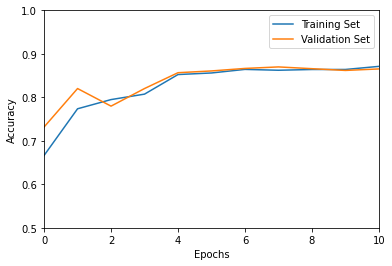

In [ ]:
training_accuracy = training_history.history['accuracy']
validation_accuracy = training_history.history['val_accuracy']

plt.figure()
plt.plot(training_accuracy, label = 'Training Set')
plt.plot(validation_accuracy, label = 'Validation Set')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.xlim([0,10])
plt.ylim([0.5,1])
plt.legend()
plt.show()

In [ ]:
model.evaluate(testing_set)

80/80 [==============================] - 8s 96ms/step - loss: 0.3461 - accuracy: 0.8683


[0.3461296260356903, 0.8683176040649414]

In [ ]:
########################################################################### ANALYSE  ################################################################################

In [11]:
model = tf.keras.models.load_model("/content/drive/MyDrive/Leukopy/EffNetB0_Final/model_B0TL")
model.evaluate(testing_set)

80/80 [==============================] - 25s 96ms/step - loss: 0.3461 - accuracy: 0.8683


[0.34612947702407837, 0.8683176040649414]

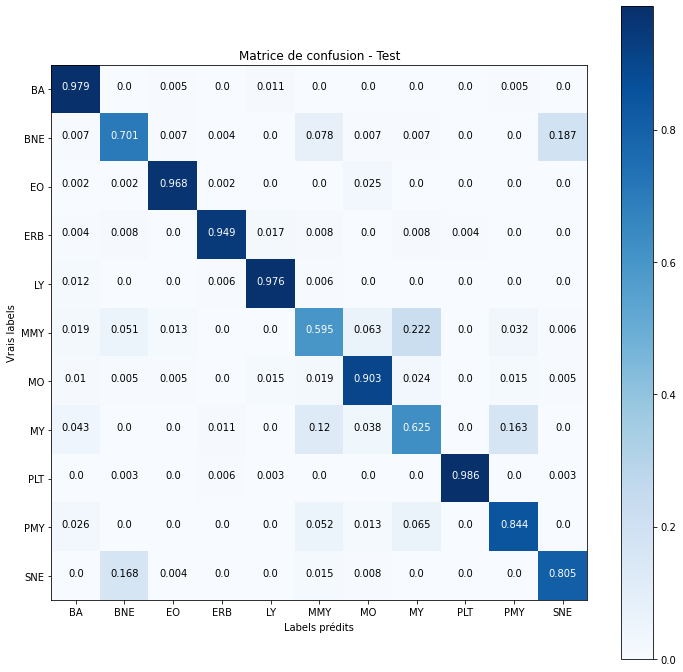

Classification Report - Test


,precision,recall,f1-score,support
BA,0.898058,0.978836,0.936709,189
BNE,0.767347,0.701493,0.732943,268
EO,0.983529,0.967593,0.975496,432
ERB,0.969828,0.949367,0.959488,237
LY,0.942529,0.97619,0.959064,168
MMY,0.618421,0.594937,0.606452,158
MO,0.849315,0.902913,0.875294,206
MY,0.70122,0.625,0.66092,184
PLT,0.997214,0.986226,0.99169,363
PMY,0.625,0.844156,0.718232,77


In [12]:
### 1 -- Rapport de classification :
def print_classification_report(testing_set, labels, title):

  # Prédiction : utilise le jeu de test (testing_set)
  predictions = model.predict(testing_set)
  y_pred = tf.argmax(predictions, axis = 1)

  # Calcul et affichage de la matrice de confusion
  cnf_matrix = confusion_matrix(testing_set.classes, y_pred, normalize = 'true')
  classes = range(len(labels))
  
  plt.figure(figsize = (12,12))
  plt.imshow(cnf_matrix, interpolation = 'nearest', cmap = 'Blues')
  plt.title("Matrice de confusion - "+title)
  plt.colorbar()

  tick_marks = np.arange(len(labels))
  plt.xticks(tick_marks, labels)
  plt.yticks(tick_marks, labels)

  for i, j in itertools.product(range(cnf_matrix.shape[0]), 
                                range(cnf_matrix.shape[1])):
    plt.text(j, i, np.around(cnf_matrix[i, j], decimals = 3),
             horizontalalignment = "center",
             color = "white" if cnf_matrix[i, j] > ( cnf_matrix.max() / 2) else "black")

  plt.ylabel('Vrais labels')
  plt.xlabel('Labels prédits')
  plt.show()

  # Rapport de classification 
  report = classification_report(testing_set.classes, y_pred, target_names = labels, output_dict = True)

  df_report = pd.DataFrame(index = list(report.keys())[:-3], columns = list(report["BA"].keys()))
  for key in list(report.keys())[:-3]:
    for column in list(report["BA"].keys()):
      df_report.loc[key, column] = report[key][column]
  
  print("Classification Report - "+title)
  return y_pred, display(df_report), 


## Bilan sur les données de test :
y_pred, df_report = print_classification_report(testing_set, label_map, title = "Test")

In [13]:
### 2 - DF avec le résultat et le label de toutes les images du test :
df_results = pd.DataFrame(data = {"real":testing_set.classes,
                                  "pred":y_pred, 
                                  "img_path":df_test["img_path"]})

# Tri des images : mal classé (df_false), bien classé (df_true):
df_false = df_results[df_results["real"] != df_results["pred"]].reset_index(drop = True)
df_true = df_results[df_results["real"] == df_results["pred"]].reset_index(drop = True)

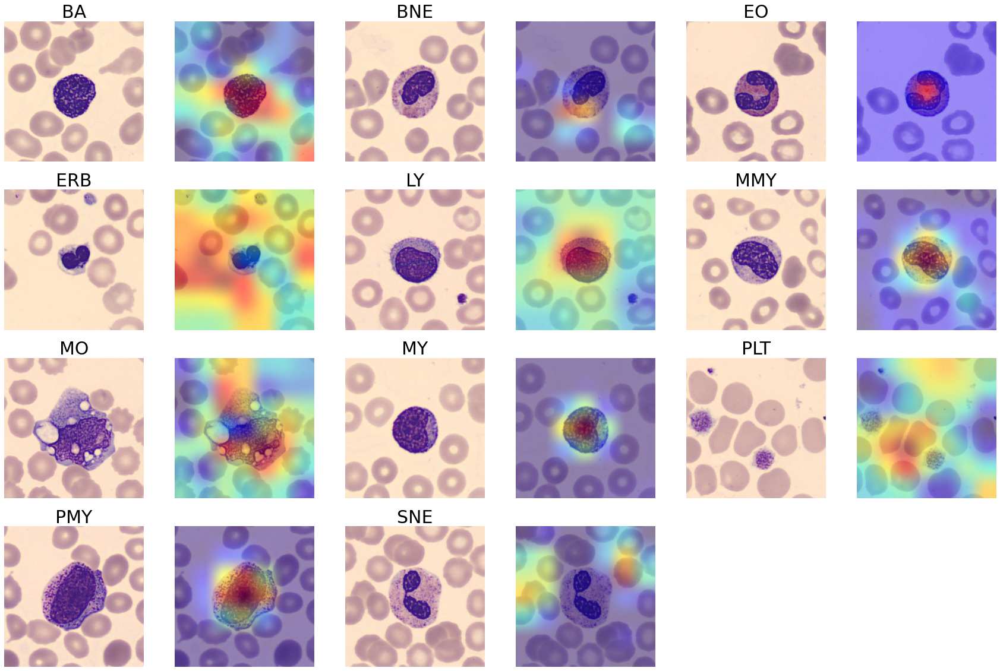

In [14]:
###################################### Grad-CAM - bien classées ##############################################################
from IPython.display import Image, display
import matplotlib.cm as cm

fig_gc = plt.figure(figsize = (30,20))
i = 1
for label in np.arange(0,11):

  # Tire un index au hasard parmi les index d'une même classe de cellules
  df_temp = df_true[df_true["real"] == label]
  idx = np.random.choice(a = df_temp.index)
        
  img_path = df_temp.loc[idx,"img_path"]

  # Grad-CAM Heatmap + superposition
  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.8, plot = False)

  plt.subplot(4,6,i)
  plt.imshow(plt.imread(img_path))
  plt.title(list(label_map.keys())[label], fontsize = 30)
  plt.grid(None)
  plt.axis('off')

  plt.subplot(4,6,i+1)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  i+=2

plt.savefig("/content/drive/MyDrive/Leukopy/EffNetB0_Final/B0_gradcam2")

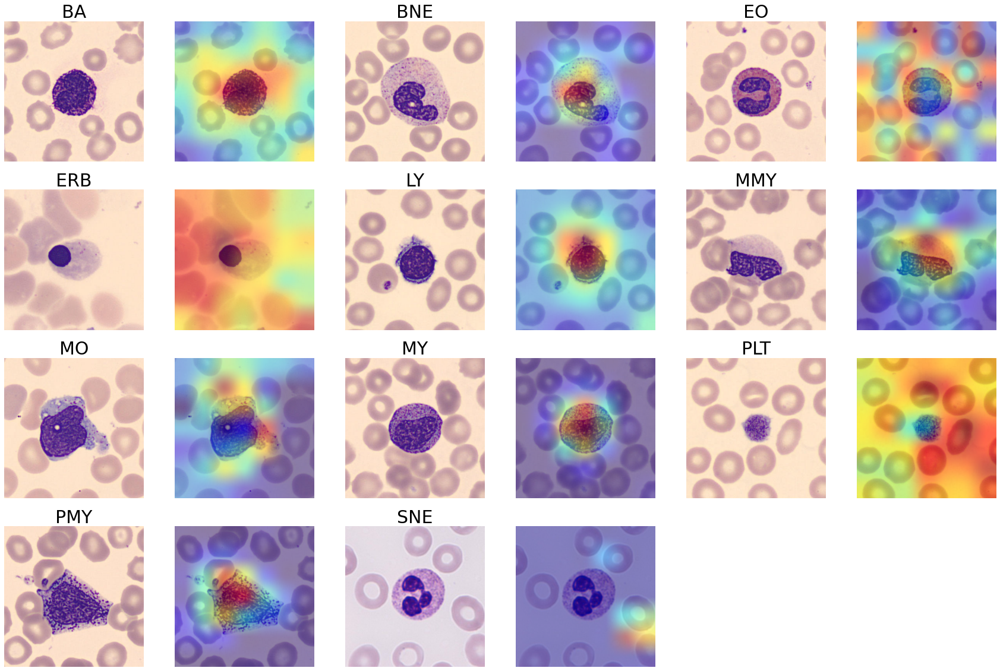

In [15]:
###################################### Grad-CAM - bien classées ##############################################################
from IPython.display import Image, display
import matplotlib.cm as cm

fig_gc = plt.figure(figsize = (30,20))

i = 1
for label in np.arange(0,11):

  # Tire un index au hasard parmi les index d'une même classe de cellules
  df_temp = df_true[df_true["real"] == label]
  idx = np.random.choice(a = df_temp.index)
        
  img_path = df_temp.loc[idx,"img_path"]

  # Grad-CAM Heatmap + superposition
  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, 
                                          class_index = None, alpha = 0.8, plot = False)

  plt.subplot(4,6,i)
  plt.imshow(plt.imread(img_path))
  plt.title(list(label_map.keys())[label], fontsize = 30)
  plt.grid(None)
  plt.axis('off')

  plt.subplot(4,6,i+1)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')
  i+=2

plt.savefig("/content/drive/MyDrive/Leukopy/EffNetB0_Final/B0_gradcam")

In [ ]:
############################################################ Bloc de classification - Structure n°2 ############################################################

In [ ]:
# Model (Functional API)

inputs = layers.Input(shape = (img_height,img_width,3))
base_model = EfficientNetB0(include_top = False,
                            weights = 'imagenet',
                            input_tensor = inputs,
                            input_shape = (img_height,img_width,3),
                            pooling = 'avg')

base_model.training = False     # Freeze EfficientNetB0 layers
base_output = base_model.output # Cette écriture permet d'avoir les couches de "base_model" au même niveau que les couches suivantes (voir model.summary())=> Grad-CAM peut fonctionner

x = layers.Dense(units = 2048, activation = 'relu', name = 'dense_1')(base_output)
x = layers.Dropout(rate = 0.2, name = 'dropout_1')(x)
x = layers.Dense(units = 1024, activation = 'relu', name = 'dense_2')(x)
x = layers.Dropout(rate = 0.2, name = 'dropout_2')(x)
x = layers.Dense(units = 512, activation = 'relu', name = 'dense_3')(x)
x = layers.Dropout(rate = 0.2, name = 'dropout_3')(x)
outputs = layers.Dense(units = n_classes, activation = 'softmax', name = 'final_softmax')(x)
model = tf.keras.Model(inputs, outputs)

base_model.trainable = False

# Compile
optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-3)
model.compile(optimizer = optimizer, 
              loss = "categorical_crossentropy",
              metrics = ["accuracy"])

In [ ]:
## Compute weights :
class_weights = compute_weights(method = 3)

## Training :
epochs = 100
training_history = model.fit(x = training_set, 
                             epochs = epochs,
                             callbacks = callbacks_list,
                             validation_data = validation_set, 
                             class_weight = class_weights)

Epoch 1/100
397/397 [==============================] - 154s 376ms/step - loss: 6.2123 - accuracy: 0.6043 - val_loss: 0.6099 - val_accuracy: 0.7803
Epoch 2/100
397/397 [==============================] - 148s 373ms/step - loss: 4.3846 - accuracy: 0.7321 - val_loss: 0.5570 - val_accuracy: 0.7960
Epoch 3/100
397/397 [==============================] - 149s 375ms/step - loss: 3.9176 - accuracy: 0.7600 - val_loss: 0.5446 - val_accuracy: 0.8006
Epoch 4/100
397/397 [==============================] - 149s 375ms/step - loss: 3.6488 - accuracy: 0.7757 - val_loss: 0.4913 - val_accuracy: 0.8162
Epoch 5/100
397/397 [==============================] - 149s 374ms/step - loss: 3.5069 - accuracy: 0.7905 - val_loss: 0.4582 - val_accuracy: 0.8237
Epoch 6/100
397/397 [==============================] - 149s 375ms/step - loss: 3.4029 - accuracy: 0.7938 - val_loss: 0.5698 - val_accuracy: 0.7902
Epoch 7/100
397/397 [==============================] - 148s 373ms/step - loss: 3.3690 - accuracy: 0.7977 - val_loss: 0

In [ ]:
## Sauvegarde avant FT
model.save("/content/drive/MyDrive/Leukopy/EffNetB0_Final/structure_2")

INFO:tensorflow:Assets written to: /content/drive/MyDrive/Leukopy/EffNetB0_Final/structure_2/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


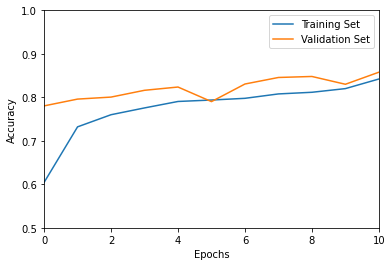

In [ ]:
training_accuracy = training_history.history['accuracy']
validation_accuracy = training_history.history['val_accuracy']

plt.figure()
plt.plot(training_accuracy, label = 'Training Set')
plt.plot(validation_accuracy, label = 'Validation Set')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.xlim([0,10])
plt.ylim([0.5,1])
plt.legend()
plt.show()

In [ ]:
model.evaluate(testing_set)

80/80 [==============================] - 8s 97ms/step - loss: 0.3421 - accuracy: 0.8632


[0.34212931990623474, 0.8632075190544128]

In [ ]:
####################### Structure 2 - Analyse

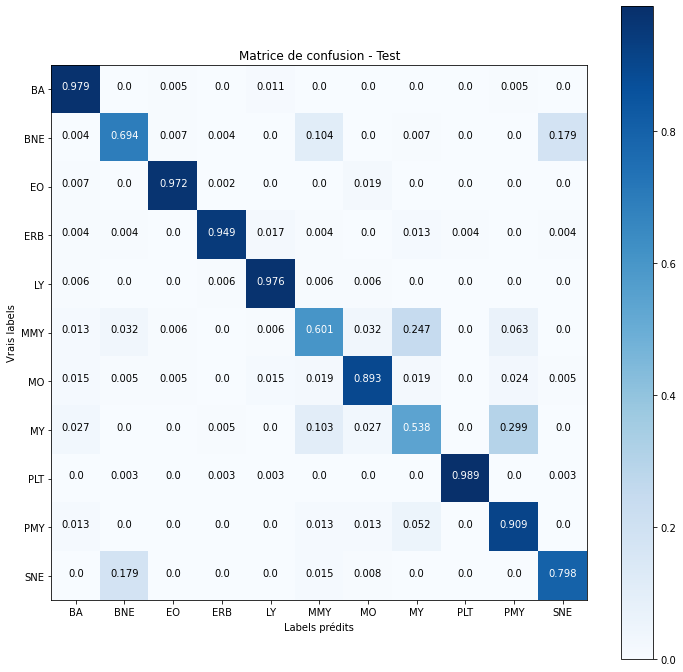

Classification Report - Test


,precision,recall,f1-score,support
BA,0.915842,0.978836,0.946292,189
BNE,0.771784,0.69403,0.730845,268
EO,0.988235,0.972222,0.980163,432
ERB,0.978261,0.949367,0.963597,237
LY,0.937143,0.97619,0.956268,168
MMY,0.620915,0.601266,0.610932,158
MO,0.893204,0.893204,0.893204,206
MY,0.655629,0.538043,0.591045,184
PLT,0.997222,0.988981,0.993084,363
PMY,0.496454,0.909091,0.642202,77


In [ ]:
### 1 - Matrice de confusion + rapport de classification
y_pred, df_report = print_classification_report(testing_set, label_map, title = "Test")

In [ ]:
### 2 - DF avec le résultat et le label de toutes les images du test :
df_results = pd.DataFrame(data = {"real":testing_set.classes,
                                  "pred":y_pred, 
                                  "img_path":df_test["img_path"]})

# Tri des images : mal classé (df_false), bien classé (df_true):
df_false = df_results[df_results["real"] != df_results["pred"]].reset_index(drop = True)
df_true = df_results[df_results["real"] == df_results["pred"]].reset_index(drop = True)

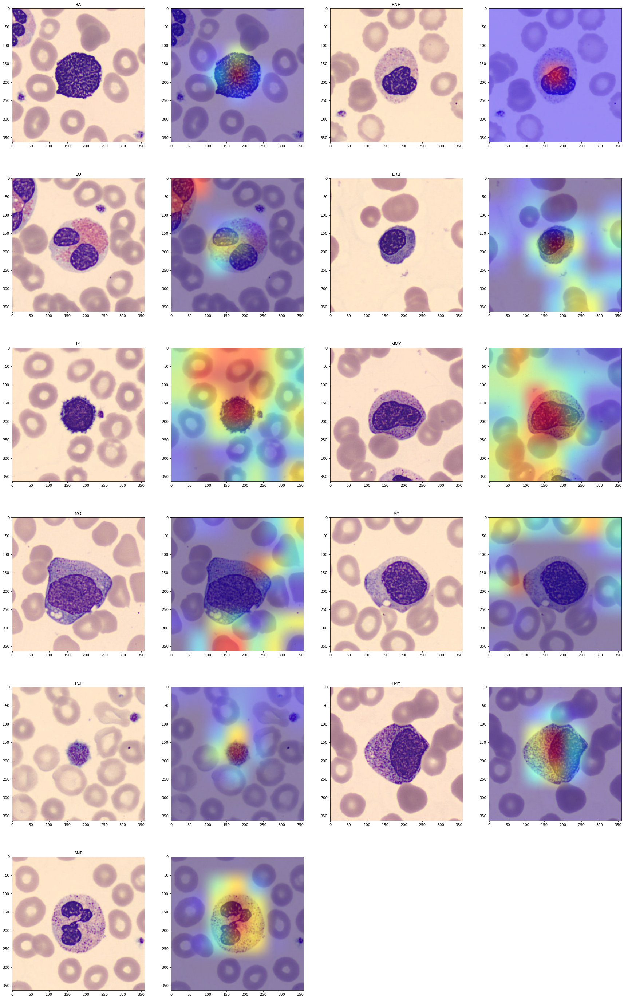

In [ ]:
### 3 - Grad-CAM - bien classées
from IPython.display import Image, display
import matplotlib.cm as cm

fig_gc = plt.figure(figsize = (30,50))

i = 1
for label in np.arange(0,11):

  # Tire un index au hasard parmi les index d'une même classe de cellules
  df_temp = df_true[df_true["real"] == label]
  idx = np.random.choice(a = df_temp.index)
        
  img_path = df_temp.loc[idx,"img_path"]

  # Grad-CAM Heatmap + superposition
  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, 
                                          class_index = None, alpha = 0.8, plot = False)

  plt.subplot(6,4,i)
  plt.imshow(plt.imread(img_path))
  plt.title(list(label_map.keys())[label])

  plt.subplot(6,4,i+1)
  plt.imshow(superimposed_img)

  i+=2

plt.savefig("/content/drive/MyDrive/Leukopy/EffNetB0_Final/B0_structure2_gradcam")

In [ ]:
############################################################ Bloc de classification - Structure n°3 ############################################################
# Comme n°2, sans Dropout

In [ ]:
# Model (Functional API)

inputs = layers.Input(shape = (img_height,img_width,3))
base_model = EfficientNetB0(include_top = False,
                            weights = 'imagenet',
                            input_tensor = inputs,
                            input_shape = (img_height,img_width,3),
                            pooling = 'avg')

base_model.training = False     # Freeze EfficientNetB0 layers
base_output = base_model.output # Cette écriture permet d'avoir les couches de "base_model" au même niveau que les couches suivantes (voir model.summary())=> Grad-CAM peut fonctionner

x = layers.Dense(units = 2048, activation = 'relu', name = 'dense_1')(base_output)
x = layers.Dense(units = 1024, activation = 'relu', name = 'dense_2')(x)
x = layers.Dense(units = 512, activation = 'relu', name = 'dense_3')(x)
outputs = layers.Dense(units = n_classes, activation = 'softmax', name = 'final_softmax')(x)
model = tf.keras.Model(inputs, outputs)

base_model.trainable = False

# Compile
optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-3)
model.compile(optimizer = optimizer, 
              loss = "categorical_crossentropy",
              metrics = ["accuracy"])

In [ ]:
## Compute weights :
class_weights = compute_weights(method = 3)

## Training :
epochs = 100
training_history = model.fit(x = training_set, 
                             epochs = epochs,
                             callbacks = callbacks_list,
                             validation_data = validation_set, 
                             class_weight = class_weights)

Epoch 1/100
397/397 [==============================] - 156s 382ms/step - loss: 5.5802 - accuracy: 0.6494 - val_loss: 0.9840 - val_accuracy: 0.6191
Epoch 2/100
397/397 [==============================] - 149s 376ms/step - loss: 3.9693 - accuracy: 0.7566 - val_loss: 0.7200 - val_accuracy: 0.7462
Epoch 3/100
397/397 [==============================] - 149s 375ms/step - loss: 3.5415 - accuracy: 0.7855 - val_loss: 0.4847 - val_accuracy: 0.8133
Epoch 4/100
397/397 [==============================] - 149s 376ms/step - loss: 3.3964 - accuracy: 0.7921 - val_loss: 0.5208 - val_accuracy: 0.8069
Epoch 5/100
397/397 [==============================] - 149s 375ms/step - loss: 3.1098 - accuracy: 0.8127 - val_loss: 0.4553 - val_accuracy: 0.8347
Epoch 6/100
397/397 [==============================] - 148s 374ms/step - loss: 2.9413 - accuracy: 0.8242 - val_loss: 0.4469 - val_accuracy: 0.8324
Epoch 7/100
397/397 [==============================] - 148s 373ms/step - loss: 2.8841 - accuracy: 0.8281 - val_loss: 0

In [ ]:
## Sauvegarde avant FT
model.save("/content/drive/MyDrive/Leukopy/EffNetB0_Final/structure_3")

INFO:tensorflow:Assets written to: /content/drive/MyDrive/Leukopy/EffNetB0_Final/structure_3/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


In [ ]:
training_accuracy = training_history.history['accuracy']
validation_accuracy = training_history.history['val_accuracy']

plt.figure()
plt.plot(training_accuracy, label = 'Training Set')
plt.plot(validation_accuracy, label = 'Validation Set')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.xlim([0,10])
plt.ylim([0.5,1])
plt.legend()
plt.show()

In [ ]:
model.evaluate(testing_set)

80/80 [==============================] - 8s 95ms/step - loss: 0.3414 - accuracy: 0.8664


[0.34138646721839905, 0.8663522005081177]

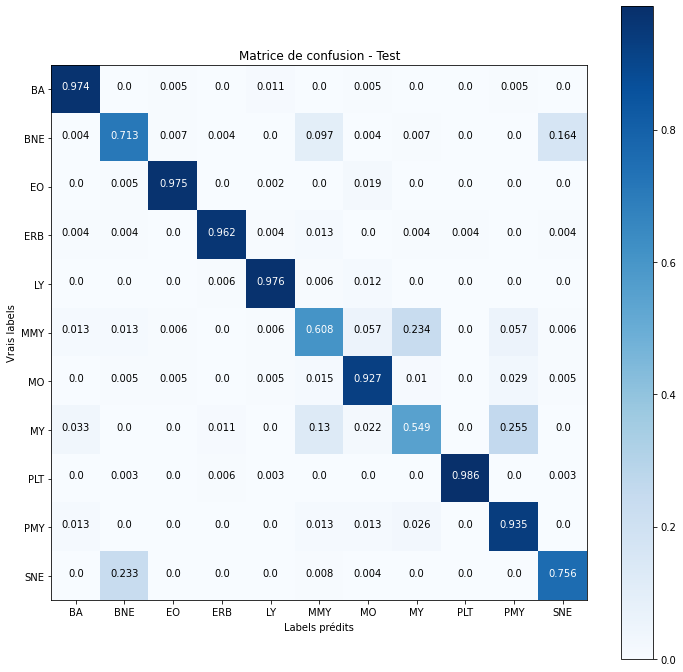

Classification Report - Test


,precision,recall,f1-score,support
BA,0.94359,0.973545,0.958333,189
BNE,0.737452,0.712687,0.724858,268
EO,0.988263,0.974537,0.981352,432
ERB,0.974359,0.962025,0.968153,237
LY,0.959064,0.97619,0.967552,168
MMY,0.615385,0.607595,0.611465,158
MO,0.876147,0.927184,0.900943,206
MY,0.696552,0.548913,0.613982,184
PLT,0.997214,0.986226,0.99169,363
PMY,0.533333,0.935065,0.679245,77


In [ ]:
##################################### Structure n°3 - Analyse
### 1 - Bilan sur les données de test :
y_pred, df_report = print_classification_report(testing_set, label_map, title = "Test")

In [ ]:
### 2 - DF avec le résultat et le label de toutes les images du test :
df_results = pd.DataFrame(data = {"real":testing_set.classes,
                                  "pred":y_pred, 
                                  "img_path":df_test["img_path"]})

# Tri des images : mal classé (df_false), bien classé (df_true):
df_false = df_results[df_results["real"] != df_results["pred"]].reset_index(drop = True)
df_true = df_results[df_results["real"] == df_results["pred"]].reset_index(drop = True)

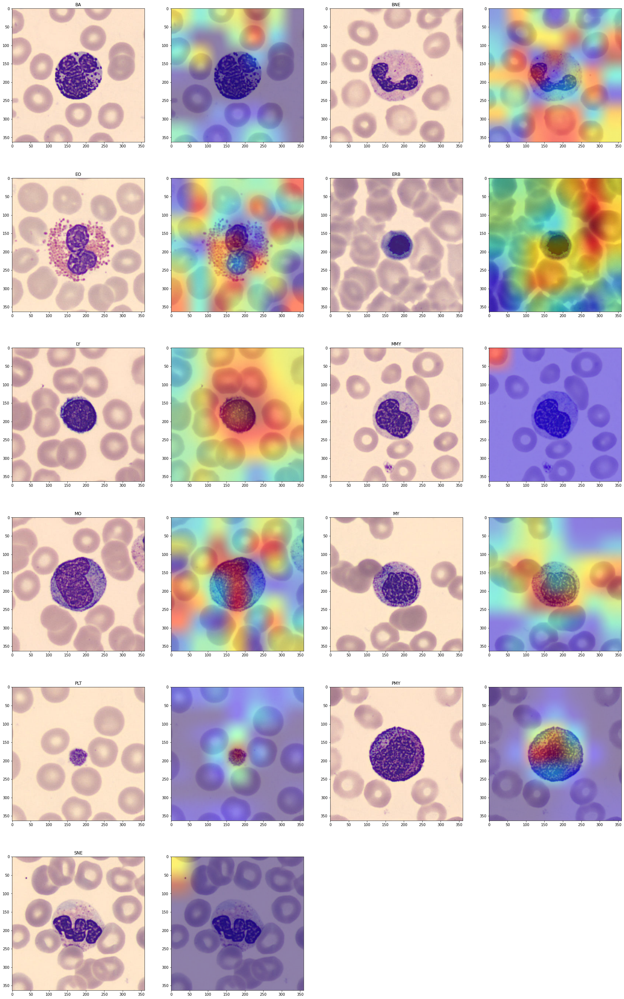

In [ ]:
### 3 - Grad-CAM - bien classées
from IPython.display import Image, display
import matplotlib.cm as cm

fig_gc = plt.figure(figsize = (30,50))

i = 1
for label in np.arange(0,11):

  # Tire un index au hasard parmi les index d'une même classe de cellules
  df_temp = df_true[df_true["real"] == label]
  idx = np.random.choice(a = df_temp.index)
        
  img_path = df_temp.loc[idx,"img_path"]

  # Grad-CAM Heatmap + superposition
  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, 
                                          class_index = None, alpha = 0.8, plot = False)

  plt.subplot(6,4,i)
  plt.imshow(plt.imread(img_path))
  plt.title(list(label_map.keys())[label])

  plt.subplot(6,4,i+1)
  plt.imshow(superimposed_img)

  i+=2

plt.savefig("/content/drive/MyDrive/Leukopy/EffNetB0_Final/B0_structure3_gradcam")

In [ ]:
################################################################## Structure 1 - Batch size 16 ##################################################################

In [ ]:
batch_size = 16
img_height  = 224
img_width = 224

# Augmentation seulement sur le jeu d'entraînement. On ne normalise pas, EfficientNet le fait lui-même.
train_generator = ImageDataGenerator(rotation_range = 90,
                                     horizontal_flip = True, 
                                     vertical_flip = True)
valid_generator = ImageDataGenerator()
test_generator = ImageDataGenerator()

# Batchs, redimensionnement, chargement des images
training_set = train_generator.flow_from_dataframe(df_train, 
                                                   directory = None, # utilise x_col
                                                   x_col = 'img_path', 
                                                   y_col = 'label',
                                                   target_size = (img_height, img_width), 
                                                   color_mode = 'rgb',
                                                   classes = None,   # utilise y_col
                                                   class_mode = 'categorical', 
                                                   batch_size = batch_size, 
                                                   shuffle = True)

validation_set = valid_generator.flow_from_dataframe(df_valid, 
                                                     directory = None, # utilise x_col
                                                     x_col = 'img_path', 
                                                     y_col = 'label',
                                                     target_size = (img_height, img_width), 
                                                     color_mode = 'rgb',
                                                     classes = None,   # utilise y_col
                                                     class_mode = 'categorical', 
                                                     batch_size = batch_size, 
                                                     shuffle = True)

testing_set = test_generator.flow_from_dataframe(df_test, 
                                                 directory = None, # utilise x_col
                                                 x_col = 'img_path', 
                                                 y_col = 'label',
                                                 target_size = (img_height, img_width),
                                                 color_mode = 'rgb',
                                                 classes = None,   # utilise y_col
                                                 class_mode = 'categorical', 
                                                 batch_size = batch_size, 
                                                 shuffle = False)

# Labels/Index connection :
label_map = training_set.class_indices
print('Train :', training_set.class_indices)
print('Valid :', validation_set.class_indices)
print('Test  :', testing_set.class_indices)

Found 12677 validated image filenames belonging to 11 classes.
Found 1730 validated image filenames belonging to 11 classes.
Found 2544 validated image filenames belonging to 11 classes.
Train : {'BA': 0, 'BNE': 1, 'EO': 2, 'ERB': 3, 'LY': 4, 'MMY': 5, 'MO': 6, 'MY': 7, 'PLT': 8, 'PMY': 9, 'SNE': 10}
Valid : {'BA': 0, 'BNE': 1, 'EO': 2, 'ERB': 3, 'LY': 4, 'MMY': 5, 'MO': 6, 'MY': 7, 'PLT': 8, 'PMY': 9, 'SNE': 10}
Test  : {'BA': 0, 'BNE': 1, 'EO': 2, 'ERB': 3, 'LY': 4, 'MMY': 5, 'MO': 6, 'MY': 7, 'PLT': 8, 'PMY': 9, 'SNE': 10}


In [ ]:
# Model (Functional API)
inputs = layers.Input(shape = (img_height,img_width,3))
base_model = EfficientNetB0(include_top = False,
                            weights = 'imagenet',
                            input_tensor = inputs,
                            input_shape = (img_height,img_width,3),
                            pooling = 'avg')

base_model.training = False     # Freeze EfficientNetB0 layers
base_output = base_model.output # Cette écriture permet d'avoir les couches de "base_model" au même niveau que les couches suivantes (voir model.summary())=> Grad-CAM peut fonctionner

x = layers.Dense(units = 1280, activation = 'relu', name = 'dense_1')(base_output)
x = layers.Dense(units = 640, activation = 'relu', name = 'dense_2')(x)
outputs = layers.Dense(units = n_classes, activation = 'softmax', name = 'final_softmax')(x)
model = tf.keras.Model(inputs, outputs)

base_model.trainable = False

# Compile
optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-3)
model.compile(optimizer = optimizer, 
              loss = "categorical_crossentropy",
              metrics = ["accuracy"])

16719872/16705208 [==============================] - 0s 0us/step


In [ ]:
## Compute weights :
class_weights = compute_weights(method = 3)

## Training :
epochs = 30
training_history = model.fit(x = training_set, 
                             epochs = epochs,
                             callbacks = callbacks_list,
                             validation_data = validation_set, 
                             class_weight = class_weights)

Epoch 1/30
793/793 [==============================] - 160s 195ms/step - loss: 5.2268 - accuracy: 0.6782 - val_loss: 0.5931 - val_accuracy: 0.7792
Epoch 2/30
793/793 [==============================] - 153s 192ms/step - loss: 3.8114 - accuracy: 0.7687 - val_loss: 0.5013 - val_accuracy: 0.8104
Epoch 3/30
793/793 [==============================] - 152s 192ms/step - loss: 3.3911 - accuracy: 0.7960 - val_loss: 0.4919 - val_accuracy: 0.8162
Epoch 4/30
793/793 [==============================] - 152s 192ms/step - loss: 3.2478 - accuracy: 0.8051 - val_loss: 0.4602 - val_accuracy: 0.8324
Epoch 5/30
793/793 [==============================] - 152s 191ms/step - loss: 3.0716 - accuracy: 0.8154 - val_loss: 0.4621 - val_accuracy: 0.8318
Epoch 6/30
793/793 [==============================] - 153s 193ms/step - loss: 2.9639 - accuracy: 0.8229 - val_loss: 0.4326 - val_accuracy: 0.8358
Epoch 7/30
793/793 [==============================] - 152s 191ms/step - loss: 2.8252 - accuracy: 0.8310 - val_loss: 0.3946 -

In [ ]:
## Sauvegarde avant FT
model.save("/content/drive/MyDrive/Leukopy/EffNetB0_Final/model_B0TL_batchsize16")

INFO:tensorflow:Assets written to: /content/drive/MyDrive/Leukopy/EffNetB0_Final/model_B0TL_batchsize16/assets


INFO:tensorflow:Assets written to: /content/drive/MyDrive/Leukopy/EffNetB0_Final/model_B0TL_batchsize16/assets
/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


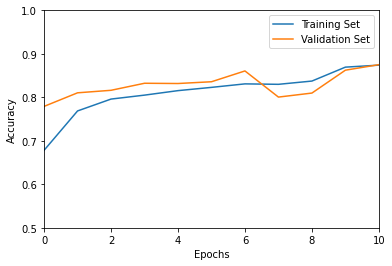

In [ ]:
training_accuracy = training_history.history['accuracy']
validation_accuracy = training_history.history['val_accuracy']

plt.figure()
plt.plot(training_accuracy, label = 'Training Set')
plt.plot(validation_accuracy, label = 'Validation Set')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.xlim([0,10])
plt.ylim([0.5,1])
plt.legend()
plt.show()

In [ ]:
model.evaluate(testing_set)

159/159 [==============================] - 8s 51ms/step - loss: 0.3378 - accuracy: 0.8719


[0.33783265948295593, 0.8718553185462952]

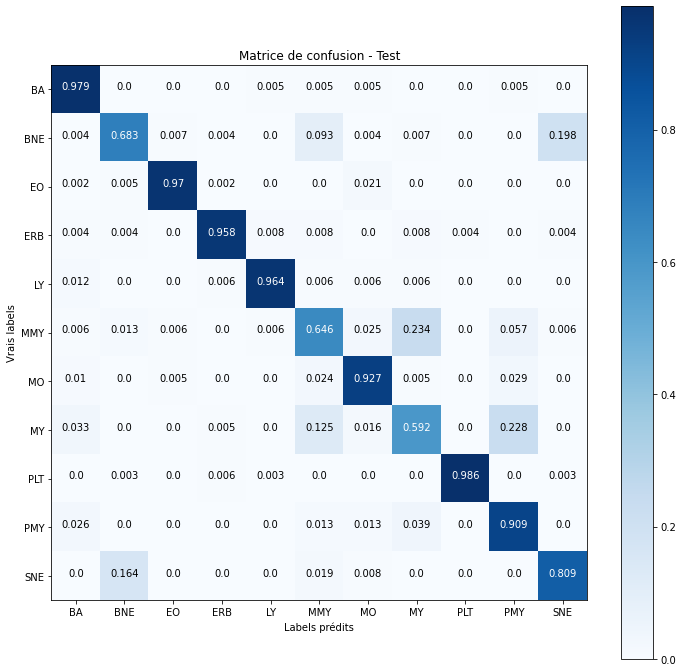

Classification Report - Test


,precision,recall,f1-score,support
BA,0.920398,0.978836,0.948718,189
BNE,0.788793,0.682836,0.732,268
EO,0.990544,0.969907,0.980117,432
ERB,0.974249,0.957806,0.965957,237
LY,0.97006,0.964286,0.967164,168
MMY,0.618182,0.64557,0.631579,158
MO,0.896714,0.927184,0.911695,206
MY,0.703226,0.592391,0.643068,184
PLT,0.997214,0.986226,0.99169,363
PMY,0.546875,0.909091,0.682927,77


In [ ]:
### 1 - Bilan sur les données de test :
y_pred, df_report = print_classification_report(testing_set, label_map, title = "Test")

In [ ]:
### 2 - DF avec le résultat et le label de toutes les images du test :
df_results = pd.DataFrame(data = {"real":testing_set.classes,
                                  "pred":y_pred, 
                                  "img_path":df_test["img_path"]})

# Tri des images : mal classé (df_false), bien classé (df_true):
df_false = df_results[df_results["real"] != df_results["pred"]].reset_index(drop = True)
df_true = df_results[df_results["real"] == df_results["pred"]].reset_index(drop = True)

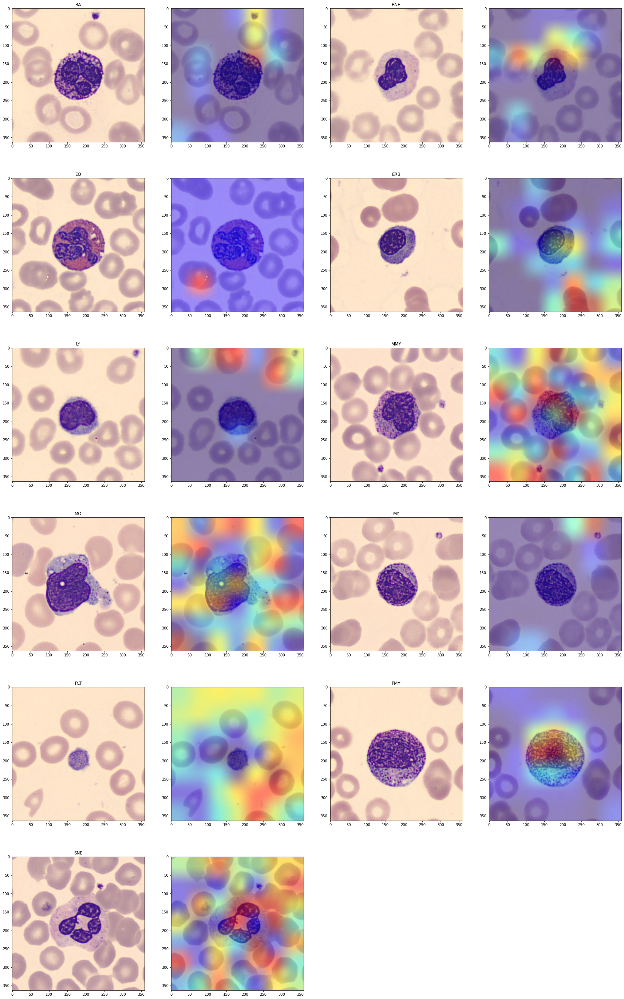

In [ ]:
### 3 - Grad-CAM - bien classées
from IPython.display import Image, display
import matplotlib.cm as cm

fig_gc = plt.figure(figsize = (30,50))

i = 1
for label in np.arange(0,11):

  # Tire un index au hasard parmi les index d'une même classe de cellules
  df_temp = df_true[df_true["real"] == label]
  idx = np.random.choice(a = df_temp.index)
        
  img_path = df_temp.loc[idx,"img_path"]

  # Grad-CAM Heatmap + superposition
  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, 
                                          class_index = None, alpha = 0.8, plot = False)

  plt.subplot(6,4,i)
  plt.imshow(plt.imread(img_path))
  plt.title(list(label_map.keys())[label])

  plt.subplot(6,4,i+1)
  plt.imshow(superimposed_img)

  i+=2

plt.savefig("/content/drive/MyDrive/Leukopy/EffNetB0_Final/B0_structure1_batch16_gradcam")

In [ ]:
################################################################## Structure 1 - Batch size 64 ##################################################################

In [ ]:
batch_size = 64
img_height  = 224
img_width = 224

# Augmentation seulement sur le jeu d'entraînement. On ne normalise pas, EfficientNet le fait lui-même.
train_generator = ImageDataGenerator(rotation_range = 90,
                                     horizontal_flip = True, 
                                     vertical_flip = True)
valid_generator = ImageDataGenerator()
test_generator = ImageDataGenerator()

# Batchs, redimensionnement, chargement des images
training_set = train_generator.flow_from_dataframe(df_train, 
                                                   directory = None, # utilise x_col
                                                   x_col = 'img_path', 
                                                   y_col = 'label',
                                                   target_size = (img_height, img_width), 
                                                   color_mode = 'rgb',
                                                   classes = None,   # utilise y_col
                                                   class_mode = 'categorical', 
                                                   batch_size = batch_size, 
                                                   shuffle = True)

validation_set = valid_generator.flow_from_dataframe(df_valid, 
                                                     directory = None, # utilise x_col
                                                     x_col = 'img_path', 
                                                     y_col = 'label',
                                                     target_size = (img_height, img_width), 
                                                     color_mode = 'rgb',
                                                     classes = None,   # utilise y_col
                                                     class_mode = 'categorical', 
                                                     batch_size = batch_size, 
                                                     shuffle = True)

testing_set = test_generator.flow_from_dataframe(df_test, 
                                                 directory = None, # utilise x_col
                                                 x_col = 'img_path', 
                                                 y_col = 'label',
                                                 target_size = (img_height, img_width),
                                                 color_mode = 'rgb',
                                                 classes = None,   # utilise y_col
                                                 class_mode = 'categorical', 
                                                 batch_size = batch_size, 
                                                 shuffle = False)

# Labels/Index connection :
label_map = training_set.class_indices
print('Train :', training_set.class_indices)
print('Valid :', validation_set.class_indices)
print('Test  :', testing_set.class_indices)

In [ ]:
# Model (Functional API)
inputs = layers.Input(shape = (img_height,img_width,3))
base_model = EfficientNetB0(include_top = False,
                            weights = 'imagenet',
                            input_tensor = inputs,
                            input_shape = (img_height,img_width,3),
                            pooling = 'avg')

base_model.training = False     # Freeze EfficientNetB0 layers
base_output = base_model.output # Cette écriture permet d'avoir les couches de "base_model" au même niveau que les couches suivantes (voir model.summary())=> Grad-CAM peut fonctionner

x = layers.Dense(units = 1280, activation = 'relu', name = 'dense_1')(base_output)
x = layers.Dense(units = 640, activation = 'relu', name = 'dense_2')(x)
outputs = layers.Dense(units = n_classes, activation = 'softmax', name = 'final_softmax')(x)
model = tf.keras.Model(inputs, outputs)

base_model.trainable = False

# Compile
optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-3)
model.compile(optimizer = optimizer, 
              loss = "categorical_crossentropy",
              metrics = ["accuracy"])

In [ ]:
## Compute weights :
class_weights = compute_weights(method = 3)

## Training :
epochs = 30
training_history = model.fit(x = training_set, 
                             epochs = epochs,
                             callbacks = callbacks_list,
                             validation_data = validation_set, 
                             class_weight = class_weights)

In [ ]:
## Sauvegarde avant FT
model.save("/content/drive/MyDrive/Leukopy/EffNetB0_Final/model_B0TL_batchsize64")

In [ ]:
training_accuracy = training_history.history['accuracy']
validation_accuracy = training_history.history['val_accuracy']

plt.figure()
plt.plot(training_accuracy, label = 'Training Set')
plt.plot(validation_accuracy, label = 'Validation Set')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.xlim([0,10])
plt.ylim([0.5,1])
plt.legend()
plt.show()

In [ ]:
model.evaluate(testing_set)

In [ ]:
### 1 - Bilan sur les données de test :
y_pred, df_report = print_classification_report(testing_set, label_map, title = "Test")

In [ ]:
### 2 - DF avec le résultat et le label de toutes les images du test :
df_results = pd.DataFrame(data = {"real":testing_set.classes,
                                  "pred":y_pred, 
                                  "img_path":df_test["img_path"]})

# Tri des images : mal classé (df_false), bien classé (df_true):
df_false = df_results[df_results["real"] != df_results["pred"]].reset_index(drop = True)
df_true = df_results[df_results["real"] == df_results["pred"]].reset_index(drop = True)

In [ ]:
### 3 - Grad-CAM - bien classées
from IPython.display import Image, display
import matplotlib.cm as cm

fig_gc = plt.figure(figsize = (30,50))

i = 1
for label in np.arange(0,11):

  # Tire un index au hasard parmi les index d'une même classe de cellules
  df_temp = df_true[df_true["real"] == label]
  idx = np.random.choice(a = df_temp.index)
        
  img_path = df_temp.loc[idx,"img_path"]

  # Grad-CAM Heatmap + superposition
  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, 
                                          class_index = None, alpha = 0.8, plot = False)

  plt.subplot(6,4,i)
  plt.imshow(plt.imread(img_path))
  plt.title(list(label_map.keys())[label])

  plt.subplot(6,4,i+1)
  plt.imshow(superimposed_img)

  i+=2

plt.savefig("/content/drive/MyDrive/Leukopy/EffNetB0_Final/B0_structure1_batch64_gradcam")